# **Introduction**
MediaPipe is a project by Google that offers "open-source, cross-platform, customizable ML solutions for live and streaming media". In other words, MediaPipe provides access to a wide variety of powerful Machine Learning models built with the hardware limitations of mobile devices in mind. These models include:


* ### Anatomical Models
** Hand Tracking
* * Pose Tracking
* * Facial Mesh Tracking
**  Holstic Tracking (above 3 combined)
* ### Segmentation Models
* * Seflie Segmentation
* * Hair Segmentation
* ### Object Models
* * 2D Object Detection/Tracking
* * 3D Object Detection and Pose EstimationIntroduction




---

# **Insatallation**


---



In [1]:
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 26.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.3 which is incompatible.


# **Get Dummy Data to work on**

*Connecting live camera stream to colab is difficult , so will be working on some pre captured data*

*Feel free to replace the dummy images with your selfies*


In [2]:
#loading data stored in repo
!git clone https://github.com/dev-S-t/NIMBUS_res.git

Cloning into 'NIMBUS_res'...
remote: Enumerating objects: 16, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 16 (delta 2), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (16/16), 7.67 MiB | 12.54 MiB/s, done.
Resolving deltas: 100% (2/2), done.


## Importing the dependencies

In [3]:
import cv2
import mediapipe as mp
import numpy as np
import pickle
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import animation
from PIL import Image
from IPython.display import Video
import sys
sys.path.append('/content/NIMBUS_res/')
import nb_helpers

In [4]:
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_holistic = mp.solutions.holistic
mp_pose = mp.solutions.pose
mp_face_mesh = mp.solutions.face_mesh

# FACE

## Fetch Image

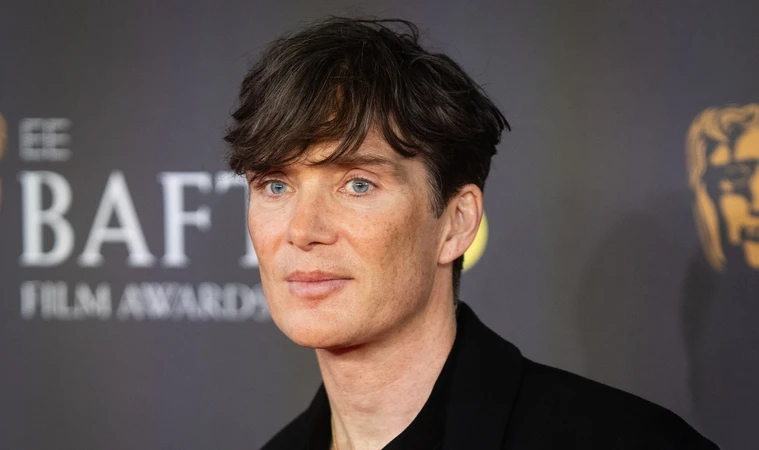

In [5]:

"""
    for uploading an image :
        1) go to files icon on left hand side click on it
        2) drag and drop personal images
        3) after uplaoding , you can see the file in the runtime file structure
        4) get the path of that file from three dots
        5) update the path
"""

path = '/content/NIMBUS_res/crush_face.jpg'

img = Image.open(path)
display(img)

In [6]:
file = path

drawing_spec = mp_drawing.DrawingSpec(thickness=2, circle_radius=0, color=[4, 244, 4])

# Create a face mesh object
with mp_face_mesh.FaceMesh(
        static_image_mode=True,
        max_num_faces=1, # experimnet with this
        refine_landmarks=True,
        min_detection_confidence=0.5) as face_mesh: # explain and play with confidence

    # Read image file with cv2 and convert from BGR to RGB
    image = cv2.imread(file)
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

face_found = bool(results.multi_face_landmarks)

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


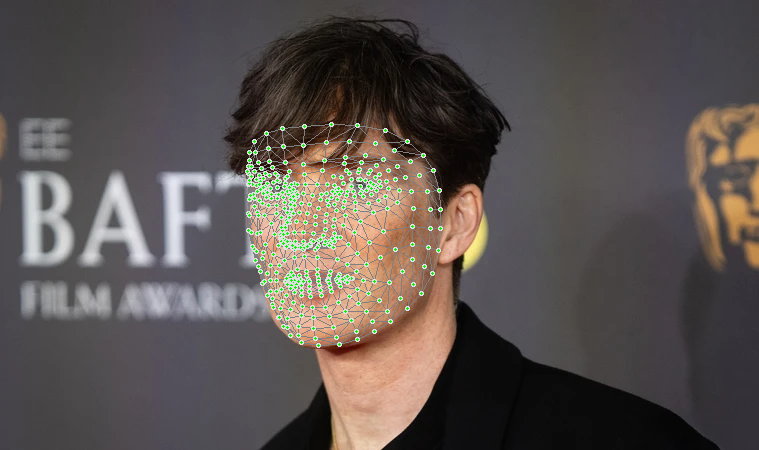

In [7]:
if face_found:
    # Create a copy of the image
    annotated_image = image.copy()

    mp_drawing.draw_landmarks(
        image=annotated_image,
        landmark_list=results.multi_face_landmarks[0],
        connections=mp_face_mesh.FACEMESH_TESSELATION,
        landmark_drawing_spec=drawing_spec,
        connection_drawing_spec=mp_drawing_styles
            .get_default_face_mesh_tesselation_style())

    cv2.imwrite('face_tesselation_only.png', annotated_image)

img = Image.open('face_tesselation_only.png')
display(img)

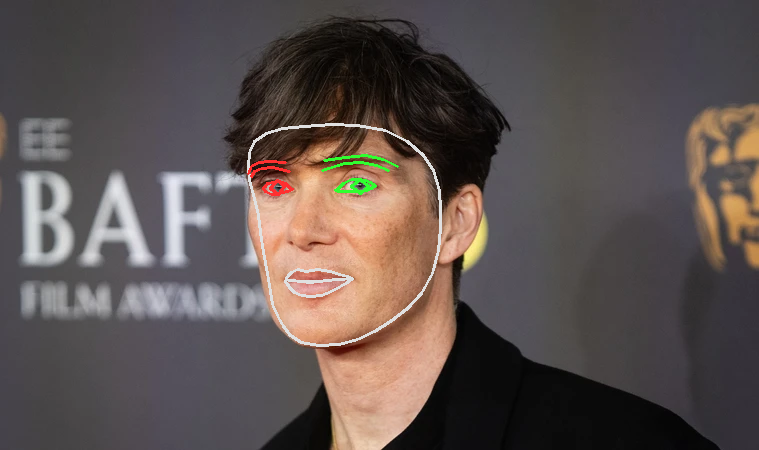

In [8]:
if face_found:
    # Create a copy of the image
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:

        mp_drawing.draw_landmarks(
            image=annotated_image,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_CONTOURS,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles
                .get_default_face_mesh_contours_style())

        mp_drawing.draw_landmarks(
            image=annotated_image,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_IRISES,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles
                .get_default_face_mesh_iris_connections_style())

    cv2.imwrite('face_contours_and_irises.png', annotated_image)

img = Image.open('face_contours_and_irises.png')
display(img)

# Pose

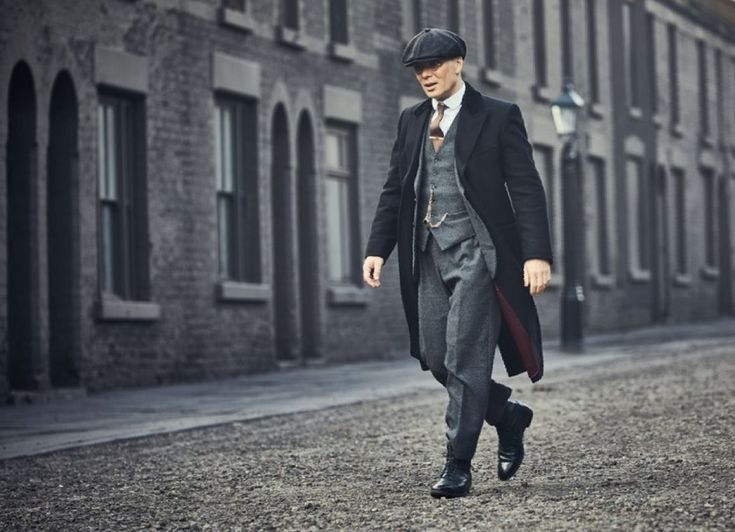

In [9]:
"""
    for uploading an image :
        1) go to files icon on left hand side click on it
        2) drag and drop personal images
        3) after uplaoding , you can see the file in the runtime file structure
        4) get the path of that file from three dots
        5) update the path
"""

path = '/content/NIMBUS_res/pose1..jpg'


img = Image.open(path)
display(img)

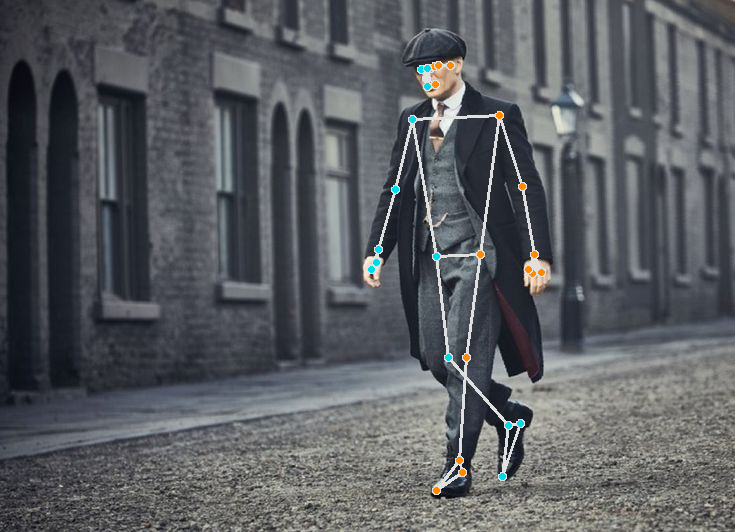

In [10]:
# Specify the image filename
file = path

# Create a MediaPipe `Pose` object
with mp_pose.Pose(static_image_mode=True,
                  model_complexity=2,
                  enable_segmentation=True) as pose:

    # Read the file in and get dims
    image = cv2.imread(file)

    # Convert the BGR image to RGB and then process with the `Pose` object.
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# Copy the iamge
annotated_image = image.copy()

# Draw pose, left and right hands, and face landmarks on the image with drawing specification defaults.
mp_drawing.draw_landmarks(annotated_image,
                          results.pose_landmarks,
                          mp_pose.POSE_CONNECTIONS,
                          landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style())

# Save image with drawing
filename = "pose_wireframe.png"
cv2.imwrite(filename, annotated_image)

# Open image
display(Image.open(filename))

## Segment Image

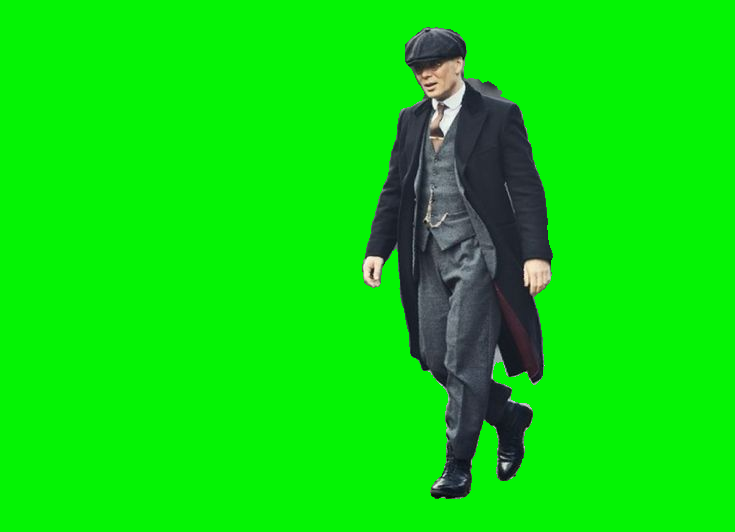

In [11]:
segmented_image = image.copy()

# Value in [0, 1] that says how "tight" to make the segmentation. Greater => tighter
tightness = .3

# Stacks the segmentation mask for 3 RGB channels, and then creates a filter for which pixels to keep
condition = np.stack((results.segmentation_mask,) * 3, axis=-1) > tightness

# Creates a black background image
bg_image = np.zeros(image.shape, dtype=np.uint8)

# Can change the color by specifying (0-255) RGB values below
bg_image[:] = [4, 244, 4]

# Where the condition is met (i.e. above inclusion threshold), display annotated image
# Otherwise, use the background color
segmented_image = np.where(condition, segmented_image, bg_image)

filename = 'pose_green_screen.png'
cv2.imwrite(filename, segmented_image)
display(Image.open(filename))

# Exporting Raw Data from MediaPipe
Exporting the raw XYZ data from MediaPipe is very easy, but we'll need some additional information to plot the data in a comprehensible way.

In particular, it is important to understand that MediaPipe stores landmarks in a consistently ordered way. That is, `mp.solutions.pose.PoseLandmark` specifies which XYZ coordinates in `results.pose_landmarks `(the output after processing an image) correspond to which body landmark (nose, right elbow, etc.). Note that the order of the body landmarks in this list is arbitrary but consistent within MediaPipe from run-to-run. You can access a more readable version of the ordered list of anatomical landmarks with `nb_helpers.poselandmarks_list.`

MediaPipe's `POSE_CONNECTIONS` object is a frozen set that contains tuples defining how these landmarks map to each other. For example, the tuple (0, 4) is in `POSE_CONNECTIONS`, indicating that the zeroth and fourth spatial points in `results.pose_landmarks` connect with each other (corresponding to "NOSE" and the "LEFT_OUTER_EYE" in `mp.solutions.pose.PoseLandmark` - the zeroth and fourth body landmarks respectively). Let's print out a few of these connections to make this idea concrete:

In [12]:
poselandmarks_list = nb_helpers.poselandmarks_list

num = 0
for i in mp_holistic.POSE_CONNECTIONS:
    if num < 5:
        print(poselandmarks_list[i[0]], '-->', poselandmarks_list[i[1]])
    else:
        break
    num += 1

LEFT_WRIST --> LEFT_THUMB
RIGHT_WRIST --> RIGHT_INDEX
RIGHT_PINKY --> RIGHT_INDEX
LEFT_EYE_OUTER --> LEFT_EAR
RIGHT_ELBOW --> RIGHT_WRIST


This point having been understood, we are ready to handle the raw MediaPipe spatial data. Let's save the above pose data as a NumPy array and then display it

In [13]:
# Create a 3x33 array to store XYZ data for 33 landmarks
data = np.empty((3, len(mp_holistic.PoseLandmark)))

# Store the XYZ data for each landmark
landmarks = results.pose_world_landmarks.landmark
for i in range(len(mp_holistic.PoseLandmark)):
    data[:, i] = (landmarks[i].x, landmarks[i].y, landmarks[i].z)

# Plot the data
fig = plt.figure()
fig.set_size_inches(5, 5, True)
ax = fig.add_subplot(projection='3d')

nb_helpers.plot_data(data, ax)
nb_helpers.scale_axes(ax)

# Save a rotation animation of the data
filename = 'pose_rotation.mp4'
nb_helpers.rotate_and_save(fig, ax, filename, save=True)

In [14]:
Video(filename, embed=True, width=500, html_attributes='loop autoplay')

# Do with Video

In [15]:
file = '/content/NIMBUS_res/walk.mp4'
with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:

    cap = cv2.VideoCapture(file)

    if cap.isOpened() == False:
        print("Error opening video stream or file")
        raise TypeError

    length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    data = np.zeros((3, len(mp_pose.PoseLandmark), length))


    frame_num = 0
    while cap.isOpened():
        ret, image = cap.read()
        if not ret:
            break

        image = cv2.cvtColor(cv2.flip(image, 1), cv2.COLOR_BGR2RGB)
        results = pose.process(image)

        landmarks = results.pose_world_landmarks.landmark
        for i in range(len(mp_pose.PoseLandmark)):
            data[:, i, frame_num] = (landmarks[i].x, landmarks[i].y, landmarks[i].z)

        frame_num += 1

    cap.release()
    #out.release()

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


In [ ]:
Video(file, embed=True, width=500, html_attributes='loop autoplay')

In [16]:
data.shape

(3, 33, 553)

In [17]:
fig = plt.figure()
fig.set_size_inches(5, 5, True)
ax = fig.add_subplot(projection='3d')

anim = nb_helpers.time_animate(data, fig, ax)

# Save
anim.save('walking_wireframe.mp4', fps=30, extra_args=['-vcodec', 'libx264'], dpi=300)

In [18]:
Video('/content/walking_wireframe.mp4', embed=True, width=500, html_attributes='loop autoplay')

FOR SOME REASON THE WIREFRAME VID DOES"T LOAD , DOWNLOAD IT AND THE VIEW ON LOCAL

why the glitches in some parts like legs in dummy file?
not visible hence needs to predict

NOw some projects based on mediapipe